# TED Talks Segmentation and Topics Extraction using Machine Learning

TED Talks are knowledge videos of talks by experts in technology, entertainment, and design (hence TED). These conferences are arranged across the world. Great speakers come forward and share their experiences and knowledge. These talks are limited to a maximum length of 18 minutes and cover a wide range of topics. The videos are stored, and every video has a description of the video content.
This project groups TED Talks based on their description and uses various clustering techniques like k-means and hierarchical clustering. Topic modeling using Latent Dirichlet Allocation (LDA) is used to understand and interpret each cluster. The libraries used include Genism, NLTK, scikit-learn, and word2vec.

## Data Wrangling

In [1]:
# import Libraries
import pandas as pd
import numpy as np
import nltk
import re
import itertools
import scipy
import string
import gensim
import seaborn as sns
import matplotlib.pyplot as plt 

from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer, SnowballStemmer
from nltk.corpus import wordnet
from nltk.util import ngrams
from spellchecker import SpellChecker

from scipy import spatial
from gensim.models import Word2Vec
from textblob import TextBlob, Word

"""
nltk.download('stopwords')
nltk.download('omw-1.4')
"""


sw = nltk.corpus.stopwords.words('english')
stemmer = SnowballStemmer('english')
st = PorterStemmer()

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.cluster import KMeans

import os
import pickle

import warnings
warnings.filterwarnings("ignore")


In [2]:
def set_plotting_style():
    # Set the default style
    sns.set_style('darkgrid')
    
    # Set the default context with font scale
    sns.set_context('paper', font_scale=1.2, rc={'lines.linewidth': 1.0})
    
    # Set the default color palette
    sns.set_palette('viridis')
    
    # Set the default figure size
    plt.rcParams['figure.figsize'] = [10, 6]

# Call the function to set the default plotting style
set_plotting_style()
  
    

## Gather

In [3]:
# Load the data
ted_df = pd.read_csv(r'C:\Users\HP\Desktop\TED Talks Segmentation\Data\Raw\ted_main.csv')

# Diplay first 5 rows of the data
ted_df.head()

,comments,description,duration,event,film_date,languages,main_speaker,name,num_speaker,published_date,ratings,related_talks,speaker_occupation,tags,title,url,views
0,4553,Sir Ken Robinson makes an entertaining and pro...,1164,TED2006,1140825600,60,Ken Robinson,Ken Robinson: Do schools kill creativity?,1,1151367060,"[{'id': 7, 'name': 'Funny', 'count': 19645}, {...","[{'id': 865, 'hero': 'https://pe.tedcdn.com/im...",Author/educator,"['children', 'creativity', 'culture', 'dance',...",Do schools kill creativity?,https://www.ted.com/talks/ken_robinson_says_sc...,47227110
1,265,With the same humor and humanity he exuded in ...,977,TED2006,1140825600,43,Al Gore,Al Gore: Averting the climate crisis,1,1151367060,"[{'id': 7, 'name': 'Funny', 'count': 544}, {'i...","[{'id': 243, 'hero': 'https://pe.tedcdn.com/im...",Climate advocate,"['alternative energy', 'cars', 'climate change...",Averting the climate crisis,https://www.ted.com/talks/al_gore_on_averting_...,3200520
2,124,New York Times columnist David Pogue takes aim...,1286,TED2006,1140739200,26,David Pogue,David Pogue: Simplicity sells,1,1151367060,"[{'id': 7, 'name': 'Funny', 'count': 964}, {'i...","[{'id': 1725, 'hero': 'https://pe.tedcdn.com/i...",Technology columnist,"['computers', 'entertainment', 'interface desi...",Simplicity sells,https://www.ted.com/talks/david_pogue_says_sim...,1636292
3,200,"In an emotionally charged talk, MacArthur-winn...",1116,TED2006,1140912000,35,Majora Carter,Majora Carter: Greening the ghetto,1,1151367060,"[{'id': 3, 'name': 'Courageous', 'count': 760}...","[{'id': 1041, 'hero': 'https://pe.tedcdn.com/i...",Activist for environmental justice,"['MacArthur grant', 'activism', 'business', 'c...",Greening the ghetto,https://www.ted.com/talks/majora_carter_s_tale...,1697550
4,593,You've never seen data presented like this. Wi...,1190,TED2006,1140566400,48,Hans Rosling,Hans Rosling: The best stats you've ever seen,1,1151440680,"[{'id': 9, 'name': 'Ingenious', 'count': 3202}...","[{'id': 2056, 'hero': 'https://pe.tedcdn.com/i...",Global health expert; data visionary,"['Africa', 'Asia', 'Google', 'demo', 'economic...",The best stats you've ever seen,https://www.ted.com/talks/hans_rosling_shows_t...,12005869


In [4]:
# Load transcripts data
transcripts_df = pd.read_csv(r'C:\Users\HP\Desktop\TED Talks Segmentation\Data\Raw\transcripts.csv')

# Diplay first 5 rows of the data

transcripts_df.head()

,transcript,url
0,Good morning. How are you?(Laughter)It's been ...,https://www.ted.com/talks/ken_robinson_says_sc...
1,"Thank you so much, Chris. And it's truly a gre...",https://www.ted.com/talks/al_gore_on_averting_...
2,"(Music: ""The Sound of Silence,"" Simon & Garfun...",https://www.ted.com/talks/david_pogue_says_sim...
3,If you're here today — and I'm very happy that...,https://www.ted.com/talks/majora_carter_s_tale...
4,"About 10 years ago, I took on the task to teac...",https://www.ted.com/talks/hans_rosling_shows_t...


In [5]:
# Merge the two dataframes by url column
def merge_dataframes(df1, df2):
    """
    Merge two dataframes on the 'url' column
    
    Parameters:
    df1 (pandas DataFrame): First dataframe
    df2 (pandas DataFrame): Second dataframe
    
    Returns:
    merged_df (pandas DataFrame): Merged dataframe
    """
    
    ted_talks_df = pd.merge(df1, df2, on='url')
    
    return ted_talks_df

ted_talks_df = merge_dataframes(ted_df, transcripts_df)

# Display the first 5 rows of the new data
ted_talks_df.head()

,comments,description,duration,event,film_date,languages,main_speaker,name,num_speaker,published_date,ratings,related_talks,speaker_occupation,tags,title,url,views,transcript
0,4553,Sir Ken Robinson makes an entertaining and pro...,1164,TED2006,1140825600,60,Ken Robinson,Ken Robinson: Do schools kill creativity?,1,1151367060,"[{'id': 7, 'name': 'Funny', 'count': 19645}, {...","[{'id': 865, 'hero': 'https://pe.tedcdn.com/im...",Author/educator,"['children', 'creativity', 'culture', 'dance',...",Do schools kill creativity?,https://www.ted.com/talks/ken_robinson_says_sc...,47227110,Good morning. How are you?(Laughter)It's been ...
1,265,With the same humor and humanity he exuded in ...,977,TED2006,1140825600,43,Al Gore,Al Gore: Averting the climate crisis,1,1151367060,"[{'id': 7, 'name': 'Funny', 'count': 544}, {'i...","[{'id': 243, 'hero': 'https://pe.tedcdn.com/im...",Climate advocate,"['alternative energy', 'cars', 'climate change...",Averting the climate crisis,https://www.ted.com/talks/al_gore_on_averting_...,3200520,"Thank you so much, Chris. And it's truly a gre..."
2,124,New York Times columnist David Pogue takes aim...,1286,TED2006,1140739200,26,David Pogue,David Pogue: Simplicity sells,1,1151367060,"[{'id': 7, 'name': 'Funny', 'count': 964}, {'i...","[{'id': 1725, 'hero': 'https://pe.tedcdn.com/i...",Technology columnist,"['computers', 'entertainment', 'interface desi...",Simplicity sells,https://www.ted.com/talks/david_pogue_says_sim...,1636292,"(Music: ""The Sound of Silence,"" Simon & Garfun..."
3,200,"In an emotionally charged talk, MacArthur-winn...",1116,TED2006,1140912000,35,Majora Carter,Majora Carter: Greening the ghetto,1,1151367060,"[{'id': 3, 'name': 'Courageous', 'count': 760}...","[{'id': 1041, 'hero': 'https://pe.tedcdn.com/i...",Activist for environmental justice,"['MacArthur grant', 'activism', 'business', 'c...",Greening the ghetto,https://www.ted.com/talks/majora_carter_s_tale...,1697550,If you're here today — and I'm very happy that...
4,593,You've never seen data presented like this. Wi...,1190,TED2006,1140566400,48,Hans Rosling,Hans Rosling: The best stats you've ever seen,1,1151440680,"[{'id': 9, 'name': 'Ingenious', 'count': 3202}...","[{'id': 2056, 'hero': 'https://pe.tedcdn.com/i...",Global health expert; data visionary,"['Africa', 'Asia', 'Google', 'demo', 'economic...",The best stats you've ever seen,https://www.ted.com/talks/hans_rosling_shows_t...,12005869,"About 10 years ago, I took on the task to teac..."


### Assess

In [6]:
# Check dtypes
ted_talks_df.dtypes

comments               int64
description           object
duration               int64
event                 object
film_date              int64
languages              int64
main_speaker          object
name                  object
num_speaker            int64
published_date         int64
ratings               object
related_talks         object
speaker_occupation    object
tags                  object
title                 object
url                   object
views                  int64
transcript            object
dtype: object

In [7]:
# Check the shape of the data
ted_talks_df.shape

(2467, 18)

The `transcript` column is our column of interest. 

In [8]:
ted_df = ted_talks_df[['title', 'transcript']].astype(str)
ted_df.head()

,title,transcript
0,Do schools kill creativity?,Good morning. How are you?(Laughter)It's been ...
1,Averting the climate crisis,"Thank you so much, Chris. And it's truly a gre..."
2,Simplicity sells,"(Music: ""The Sound of Silence,"" Simon & Garfun..."
3,Greening the ghetto,If you're here today — and I'm very happy that...
4,The best stats you've ever seen,"About 10 years ago, I took on the task to teac..."


## Data Cleaning and Preprocessing

Cleaning text data is important to obtain better features. It can be achieved by doing some of the basic preprocessing steps on the data.
The following are the preprocessing steps.
1. Make words lowercase.
2. Remove stop words.
3. Correct spelling.
4. Remove numbers.
5. Remove whitespace and special characters.

In [9]:
ted_df = ted_talks_df[['transcript']].astype(str)
ted_df.head()

,transcript
0,Good morning. How are you?(Laughter)It's been ...
1,"Thank you so much, Chris. And it's truly a gre..."
2,"(Music: ""The Sound of Silence,"" Simon & Garfun..."
3,If you're here today — and I'm very happy that...
4,"About 10 years ago, I took on the task to teac..."


In [10]:
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
import re

def complete_text_processing(df, column):
    # Lower case
    df[column] = df[column].str.lower()
    
    # Removal of Punctuation
    df[column] = df[column].str.replace('[^\w\s]', '', regex=True)
    
    # Removal of Numeric
    df[column] = df[column].str.replace('\d+', '', regex=True)
    
    # Removal of stop words
    stop_words = set(ENGLISH_STOP_WORDS)
    df[column] = df[column].apply(lambda x: " ".join(word for word in x.split() if word not in stop_words))
    
    # Removal of short words
    df[column] = df[column].apply(lambda x: " ".join(word for word in x.split() if len(word) > 3))
    
    # Removal of common words
    common_words = ['the', 'a', 'an', 'and', 'or', 'but', 'is', 'if', 'then', 'else', 'this', 'that', 'these', 'those', 'am', 'are', 'was', 'were', 'be',
                    'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'would', 'should', 'could', 'ought', 'i', 'you', 'he',
                    'she', 'it', 'we', 'they', 'what', 'when', 'where', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such',
                    'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', 'too', 'very', 's', 't', 'can', 'will', 'just', 'don', 'should', 'now']
    df[column] = df[column].apply(lambda x: " ".join(word for word in x.split() if word not in common_words))
    
    
    # Stemming
    df[column] = df[column].apply(lambda x: " ".join(stemmer.stem(word) for word in x.split()))
    
    # Lemmatization
    lemmatizer = WordNetLemmatizer()
    df[column] = df[column].apply(lambda x: " ".join(lemmatizer.lemmatize(word) for word in x.split()))
    
    return df

In [11]:
# Preprocess the data
ted_df = complete_text_processing(ted_df, 'transcript')

# Display first 5 rows
ted_df.head()

,transcript
0,good morn youlaughterit great blown away thing...
1,thank chris truli great honor opportun come st...
2,music sound silenc simon garfunkelhello voic m...
3,your today happi youv heard sustain develop sa...
4,year took task teach global develop swedish un...


### Count Vectors

In [12]:
# Create a CountVectorizer object. This will help in transforming text data into a matrix of token counts.
cv = CountVectorizer()

# Fit the CountVectorizer to the data. This involves analyzing the data to construct the internal vocabulary dictionary.
cv.fit(ted_df['transcript'])

# Now, transform the 'transcript' column in the DataFrame to a matrix of token counts. This will allow us to analyze and compare the frequency of each word in the data.
cv_tedfeatures = cv.transform(ted_df['transcript'])

### TF-IDF Vector

In [13]:
# Step 1: Initialize TfidfVectorizer()
tv = TfidfVectorizer()

# Step 2: Fit the model with the entire corpus.
# In this case, we're using the 'transcript' column of the ted_df dataframe.
tv.fit(ted_df['transcript'])

# Step 3: Transform the 'transcript' data into a matrix of TF-IDF features.
# The result will be a sparse matrix in the form of (n_samples, n_features).
tv_tedfeatures = tv.transform(ted_df['transcript'])

### Word Embeddings

In [14]:
# Load the Word2Vec model
m1 = gensim.models.KeyedVectors.load_word2vec_format('C:\\Users\\HP\\Desktop\\TED Talks Segmentation\\Data\\Raw\\GoogleNews-vectors-negative300.bin', binary=True)

# Function to get the embeddings
def get_embedding(x, out=False):
    if x in m1.key_to_index:
        if out:
            return m1.key_to_index[x]
        else:
            return m1.vectors[m1.key_to_index[x]]
    else:
        return np.zeros(300)

# Getting means
op = {}
for i in ted_df['transcript']:
    tokens = nltk.word_tokenize(i)
    avg_vct_doc = np.mean(np.array([get_embedding(a) for a in tokens if a in m1.key_to_index]), axis=0)
    op[i] = avg_vct_doc

# 'op' dictionary now contains transcript text as keys and corresponding average vectors as values
op


{'good morn youlaughterit great blown away thing fact leavinglaughterther theme run confer relev want talk extraordinari evid human creativ present weve peopl varieti rang second place idea what go happen term futur idea play outi educ actual everybodi educ dont interest your dinner parti work educ actual your dinner parti franklylaughterif work educ your askedlaughterand your ask curious that strang somebodi know work educ blood face theyr like know melaughtermi night weeklaughterbut educ wall thing goe deep peopl right like religion money thing educ think huge vest part educ that meant futur grasp think child start school year retir clue despit expertis that parad past day world look like year time meant educ unpredict think extraordinaryand weve agre nonetheless realli extraordinari capac child capac innov mean sirena night marvel wasnt see shes except think shes speak except childhood person extraordinari dedic talent content kid tremend talent squander pretti ruthlesslyso want tal

In [15]:
# Create empty lists to store keys and values
results_key = []
results_value = []

# Iterate over items in the operation
for key, value in op.items():
    # Append key to the results_key list
    results_key.append(key)
    
    # Convert value to a numpy array and append it to the results_value list
    results_value.append(np.array(value))

In [16]:
# Display the results_value
results_value

[array([ 0.02473477,  0.01672636,  0.02322364,  0.105092  , -0.060313  ,
         0.02825219,  0.07771415, -0.08266766,  0.0537234 ,  0.04447259,
        -0.02283745, -0.11348544, -0.05231252,  0.01030425, -0.08915363,
         0.12342888,  0.03564772,  0.11418385,  0.00524572, -0.06345104,
        -0.01249674,  0.04176034,  0.07422785, -0.00796736,  0.02178262,
        -0.02527368, -0.07574695,  0.0229938 ,  0.02743413, -0.04901357,
        -0.04686825,  0.01756558, -0.06853435, -0.02907042, -0.01442346,
        -0.02559869,  0.05532593,  0.02097568,  0.02637591,  0.07244213,
         0.04038628, -0.0428011 ,  0.10538102, -0.00267555, -0.01188606,
        -0.03712183, -0.03176898, -0.01988991, -0.03105707,  0.04150074,
        -0.05072936,  0.03903396,  0.00042438, -0.0152545 ,  0.02566179,
         0.00100535, -0.05911335, -0.06007066,  0.04445978, -0.06468686,
        -0.00021507,  0.03296337, -0.04636925, -0.03193861, -0.01096601,
        -0.04637825, -0.06093767,  0.06676309, -0.0

We generated a single vector for each document in the corpus.
Now that we have implemented three types of feature engineering techniques. Let’s build the models using all three features and observe which one performs better.
So, let’s start the model building phase.

## Modeling

In this phase, we build clusters using the k-means method. To define an optimal number of clusters, we considered different methods like elbow, silhouette coefficient, and dendrogram method. All these methods are considered by using count vectors, word-level TF-IDF, and word embeddings as features, and then the model has been finalized based on the performance.

### KMeans Clustering

There are various techniques to define an optimal number of clusters, including 
- the elbow method, 
- the silhouette score, and 
- the dendrogram approach.

#### Using Count Vector As Features

**1. The Elbow Method**

The elbow method is a type of method for checking the consistency of clusters created. It finds the ideal number of clusters in data. Explained variance considers the percentage of variance explained and derives an ideal number of clusters. If the deviation percentage explained is compared with the number of clusters, the first cluster adds a lot of information, but at some point, explained variance decreases, which gives an angle on the graph. At the moment, the number of clusters is selected.

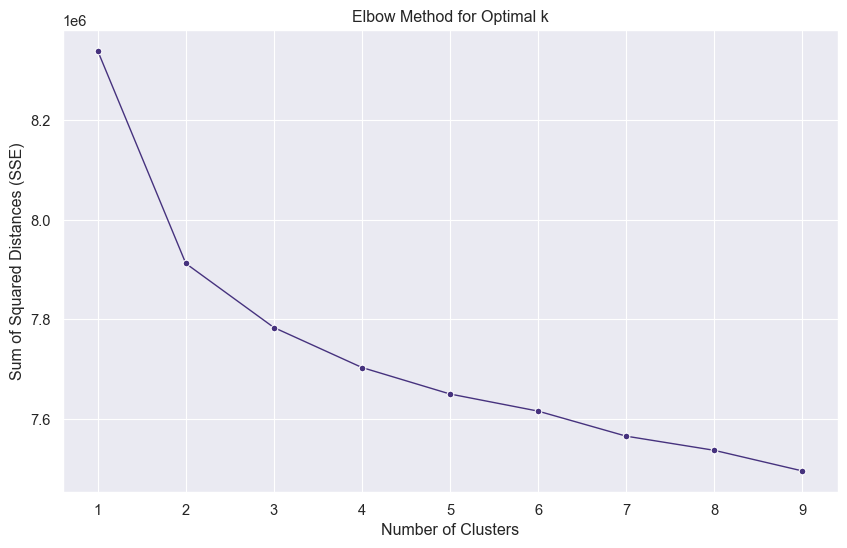

In [17]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming cv_tedfeatures is your feature matrix
# If not, replace it with your actual feature matrix

elbow_method = {}

# Iterate over a range of possible cluster numbers
for k in range(1, 10):
    # Fit KMeans with the current number of clusters
    kmeans_elbow = KMeans(n_clusters=k).fit(cv_tedfeatures)
    
    # Store the sum of squared distances to the nearest cluster center (inertia) in the dictionary
    elbow_method[k] = kmeans_elbow.inertia_

# Create a DataFrame for seaborn
import pandas as pd
elbow_df = pd.DataFrame(list(elbow_method.items()), columns=['Number of Clusters', 'SSE'])

# Plot the elbow curve using seaborn
plt.figure(figsize=(10, 6))
sns.lineplot(x='Number of Clusters', y='SSE', data=elbow_df, marker='o')
plt.xlabel("Number of Clusters")
plt.ylabel("Sum of Squared Distances (SSE)")
plt.title("Elbow Method for Optimal k")
plt.show()


**2. Silhouette Method**

The silhouette coefficient, or silhouette score, tells how much the object is similar to other clusters compared to its own cluster. The value varies from –1 to 1, where a high value indicates that the cluster fits well with itself, and the cluster does not match the neighboring cluster.
The silhouette value is calculated using distance metrics like Euclidean distance, the Manhattan distance, and so on.

For n_clusters=2, The Silhouette Coefficient is 0.1280477418796435
For n_clusters=3, The Silhouette Coefficient is 0.05023458616630207
For n_clusters=4, The Silhouette Coefficient is 0.06043644914260198
For n_clusters=5, The Silhouette Coefficient is 0.06816270515095135
For n_clusters=6, The Silhouette Coefficient is 0.05113842067904498
For n_clusters=7, The Silhouette Coefficient is 0.06992908673458788
For n_clusters=8, The Silhouette Coefficient is 0.053946750703098637
For n_clusters=9, The Silhouette Coefficient is 0.031507184387265755


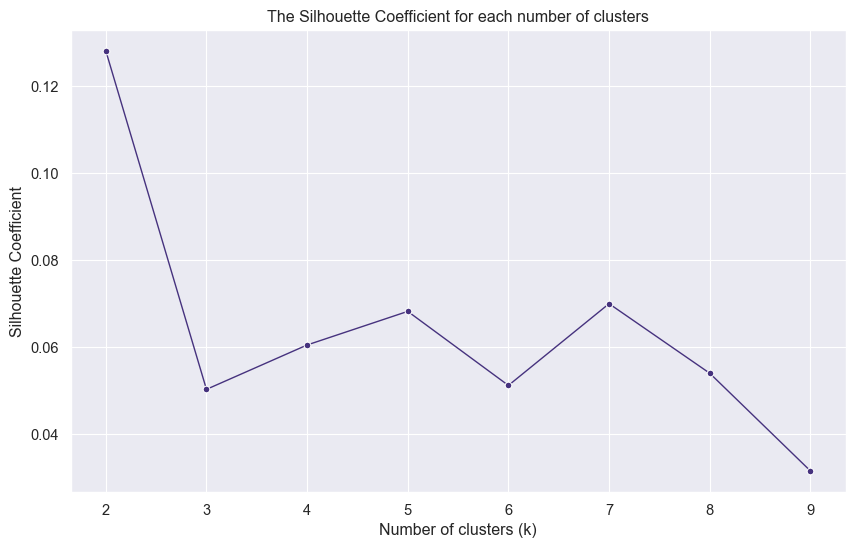

In [18]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

# Assuming cv_tedfeatures is your feature matrix
# If not, replace it with your actual feature matrix

sil_coeffs = []
K = range(2,10)

for k in K:
    kmeans = KMeans(n_clusters=k).fit(cv_tedfeatures)
    labels = kmeans.labels_
    sil_coeff = silhouette_score(cv_tedfeatures, labels, metric='euclidean')
    sil_coeffs.append(sil_coeff)
    print("For n_clusters={}, The Silhouette Coefficient is {}".format(k, sil_coeff))

# Plot the elbow curve using seaborn

sns.lineplot(x=list(K), y=sil_coeffs, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Coefficient')
plt.title('The Silhouette Coefficient for each number of clusters')
plt.show()


All the techniques suggest that two clusters are the ideal number of clusters. Let’s also implement other methods and see the results. We can leverage the same code used for the count vectorizer, change the input feature accordingly. Let’s start with the output.

#### Using TF-IDF As Features

**1. The Elbow Method**

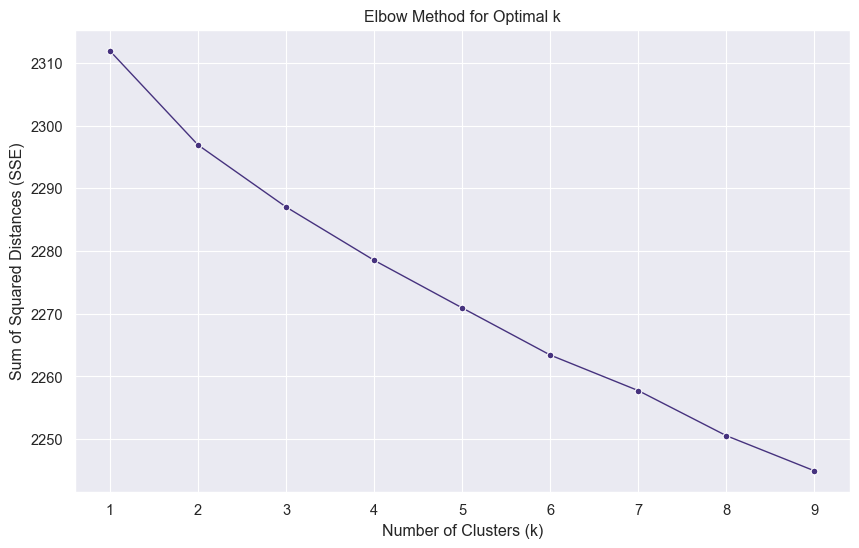

In [19]:
# Using TF-IDF as our feature matrix

elbow_method = {}

# Iterate over a range of possible cluster numbers
for k in range(1, 10):
    # Fit KMeans with the current number of clusters
    kmeans_elbow = KMeans(n_clusters=k).fit(tv_tedfeatures)
    
    # Store the sum of squared distances to the nearest cluster center (inertia) in the dictionary
    elbow_method[k] = kmeans_elbow.inertia_

# Create a DataFrame for seaborn
import pandas as pd
elbow_df = pd.DataFrame(list(elbow_method.items()), columns=['Number of Clusters', 'SSE'])

# Plot the elbow curve using seaborn
plt.figure(figsize=(10, 6))
sns.lineplot(x='Number of Clusters', y='SSE', data=elbow_df, marker='o')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Sum of Squared Distances (SSE)")
plt.title("Elbow Method for Optimal k")
plt.show()


**2. Silhouette Method**

For n_clusters=2, The Silhouette Coefficient is 0.004967688964655784
For n_clusters=3, The Silhouette Coefficient is 0.0009945758139366218
For n_clusters=4, The Silhouette Coefficient is 0.0025464797014460227
For n_clusters=5, The Silhouette Coefficient is 0.00017482322860643646
For n_clusters=6, The Silhouette Coefficient is 0.0027857502214183416
For n_clusters=7, The Silhouette Coefficient is 0.0035295099593968503
For n_clusters=8, The Silhouette Coefficient is 0.003778323400429634
For n_clusters=9, The Silhouette Coefficient is 0.004639391395326763


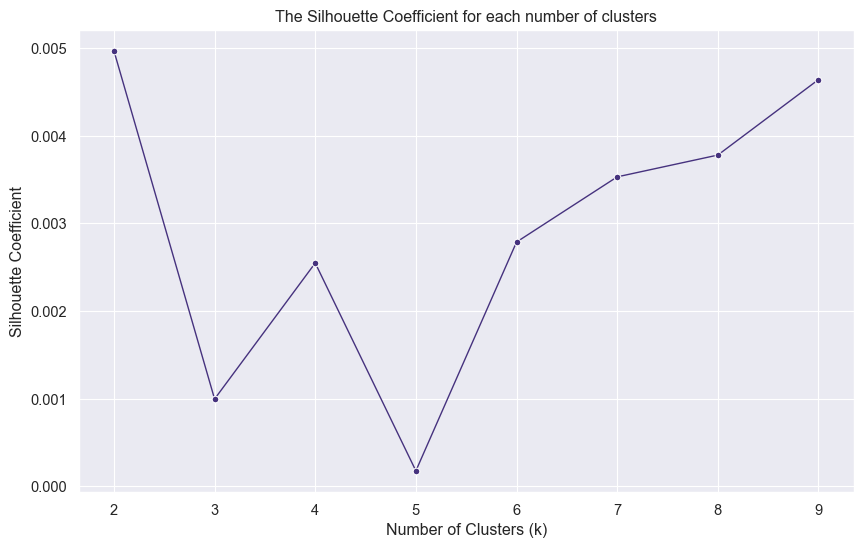

In [21]:
# Using TF-IDF as our feature matrix

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

sil_coeffs = []
K = range(2, 10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(tv_tedfeatures)
    labels = kmeanModel.labels_
    sil_coeff = silhouette_score(tv_tedfeatures, labels, metric='euclidean')
    sil_coeffs.append(sil_coeff)
    print("For n_clusters={}, The Silhouette Coefficient is {}".format(k, sil_coeff))

# Plot the elbow curve using seaborn
sns.lineplot(x=K, y=sil_coeffs, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Coefficient')
plt.title('The Silhouette Coefficient for each number of clusters')
plt.show()


Even though this method suggests two clusters, the data distribution between two clusters is not great. One cluster has very little data. Let’s also build the clusters using word embeddings before making any further decisions.

#### Using Word Embeddings as Features

**1. The Elbow Method**

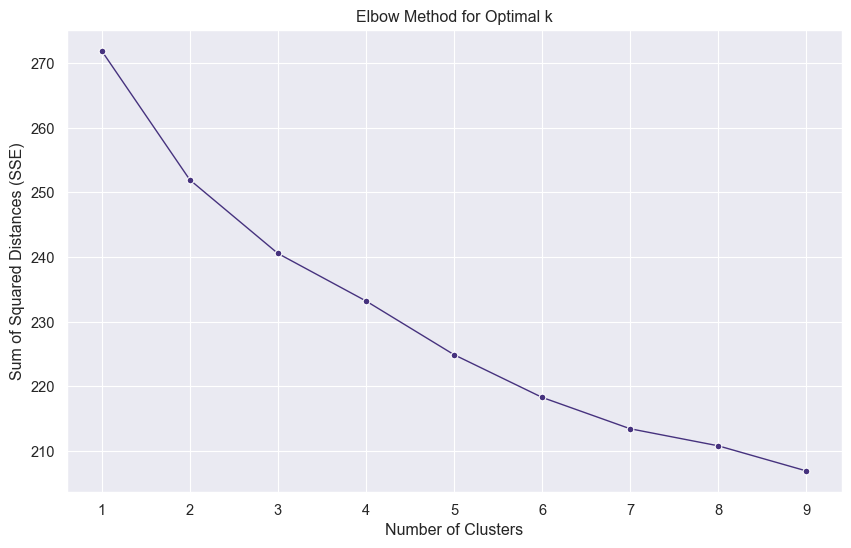

In [22]:
# Using Word Embeddings as our feature matrix

# Filter out None embeddings and ensure all embeddings are numpy arrays with the same length
embeddings = [emb for emb in op.values() if emb is not None and isinstance(emb, np.ndarray) and emb.shape[0] == 300]

# Create empty lists to store keys and values
elbow_method = {}

# Iterate over a range of possible cluster numbers
for k in range(1, 10):
    # Fit KMeans with the current number of clusters
    kmeans_elbow = KMeans(n_clusters=k).fit(embeddings)
    
    # Store the sum of squared distances to the nearest cluster center (inertia) in the dictionary
    elbow_method[k] = kmeans_elbow.inertia_

# Create a DataFrame for seaborn
import pandas as pd
elbow_df = pd.DataFrame(list(elbow_method.items()), columns=['Number of Clusters', 'SSE'])

# Plot the elbow curve using seaborn
sns.lineplot(x='Number of Clusters', y='SSE', data=elbow_df, marker='o')
plt.xlabel("Number of Clusters")
plt.ylabel("Sum of Squared Distances (SSE)")
plt.title("Elbow Method for Optimal k")
plt.show()


**2. Silhouette Method**

For n_clusters=2, The Silhouette Coefficient is 0.07583604753017426
For n_clusters=3, The Silhouette Coefficient is 0.05584319680929184
For n_clusters=4, The Silhouette Coefficient is 0.05759194493293762
For n_clusters=5, The Silhouette Coefficient is 0.06549695879220963
For n_clusters=6, The Silhouette Coefficient is 0.05517466366291046
For n_clusters=7, The Silhouette Coefficient is 0.05186726152896881
For n_clusters=8, The Silhouette Coefficient is 0.03581976145505905
For n_clusters=9, The Silhouette Coefficient is 0.04370163008570671


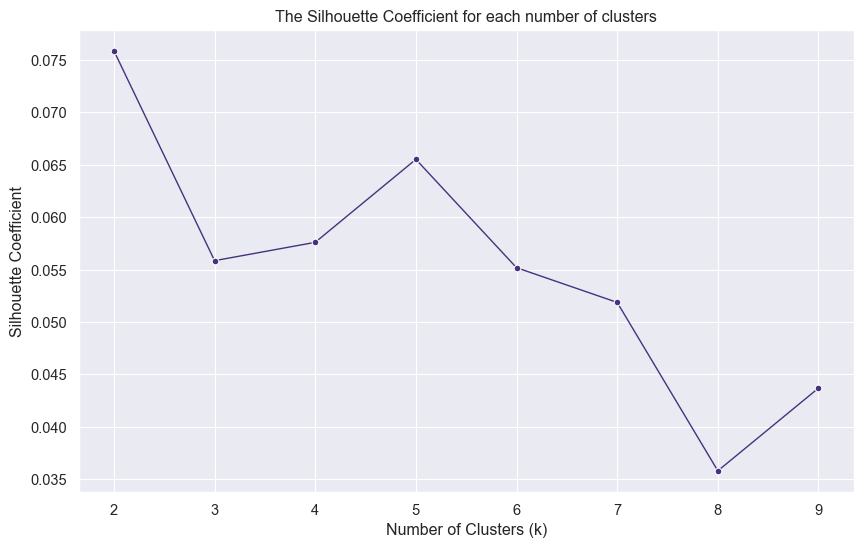

In [23]:
sil_coeffs = []
K = range(2, 10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(embeddings)
    labels = kmeanModel.labels_
    sil_coeff = silhouette_score(embeddings, labels, metric='euclidean')
    sil_coeffs.append(sil_coeff)
    print("For n_clusters={}, The Silhouette Coefficient is {}".format(k, sil_coeff))

# Plot the elbow curve using seaborn
sns.lineplot(x=list(K), y=sil_coeffs, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Coefficient')
plt.title('The Silhouette Coefficient for each number of clusters')
plt.show()

The optimal number of clusters is two. Let’s use word2vec as the final text-to-features tool since it best captures semantics and context.

## Building the Clustering Model

Let's build a KMeans Clustering Model. 

In [24]:
import numpy as np

# Check for non-numeric values
for i, array in enumerate(results_value):
    if np.ndim(array) == 0:  # If array is actually a scalar
        if not isinstance(array, (int, float)):
            print(f"Element at index {i} is a non-numeric scalar.")
    elif not all(isinstance(x, (int, float)) for x in array):
        print(f"Array at index {i} contains non-numeric values.")

# Check for null values
for i, array in enumerate(results_value):
    if np.ndim(array) == 0:  # If array is actually a scalar
        if pd.isnull(array):
            print(f"Element at index {i} is a null scalar.")
    elif any(pd.isnull(x) for x in array):
        print(f"Array at index {i} contains null values.")

Array at index 0 contains non-numeric values.
Array at index 1 contains non-numeric values.
Array at index 2 contains non-numeric values.
Array at index 3 contains non-numeric values.
Array at index 4 contains non-numeric values.
Array at index 5 contains non-numeric values.
Array at index 6 contains non-numeric values.
Array at index 7 contains non-numeric values.
Array at index 8 contains non-numeric values.
Array at index 9 contains non-numeric values.
Array at index 10 contains non-numeric values.
Array at index 11 contains non-numeric values.
Array at index 12 contains non-numeric values.
Array at index 13 contains non-numeric values.
Array at index 14 contains non-numeric values.
Array at index 15 contains non-numeric values.
Array at index 16 contains non-numeric values.
Array at index 17 contains non-numeric values.
Array at index 18 contains non-numeric values.
Array at index 19 contains non-numeric values.
Array at index 20 contains non-numeric values.
Array at index 21 conta

In [25]:
# Remove the null scalars
results_value = [v for i, v in enumerate(results_value) if i not in {146, 908, 1170, 1362, 1793, 1916}]

In [26]:
# Remove the null scalars from results_key
indices_to_remove = {146, 908, 1170, 1362, 1793, 1916}  # replace with the correct indices
results_key = [v for i, v in enumerate(results_key) if i not in indices_to_remove]

In [27]:
from sklearn.cluster import KMeans
import pandas as pd

# Using results_value as our feature vectors

# Number of clusters
num_clusters = 2

# Fit KMeans model
segments = KMeans(n_clusters=num_clusters)
segments.fit(results_value)

# Create DataFrame with transcript and cluster labels
ted_segmentation = {'transcript': results_key, 'cluster': segments.labels_}
output_df = pd.DataFrame(ted_segmentation)

# Display the number of talks per segment
talks_per_segment = output_df['cluster'].value_counts()
print(talks_per_segment)

cluster
1    1297
0    1161
Name: count, dtype: int64


In [28]:
cluster_1 = output_df[output_df.cluster == 1]
cluster_0 = output_df[output_df.cluster == 0]

### Cluster Visualization

Each cluster is visualized through the monogram word cloud

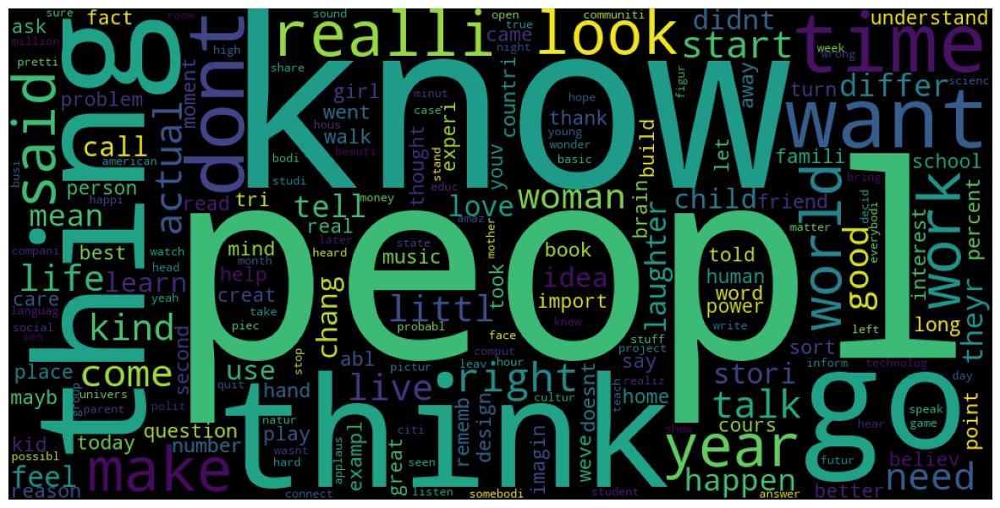

In [29]:
# Import the necessary libraries
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

# Create a WordCloud object with specific width and height
# Set collocations to False to avoid including bigrams (pairs of adjacent words)
wordcloud = WordCloud(width = 1000, height = 500, collocations = False)

# Generate the word cloud from the text in 'transcript' column of 'cluster_1'
# The ' '.join(cluster_1['transcript']) part combines all the transcripts into a single string
wordcloud = wordcloud.generate_from_text(' '.join(cluster_1['transcript']))

# Create a new figure with specific size (15x8)
plt.figure(figsize=(15,8))

# Display the generated word cloud as an image
plt.imshow(wordcloud)

# Turn off the axis labels
plt.axis("off")

# Display the figure
plt.show()

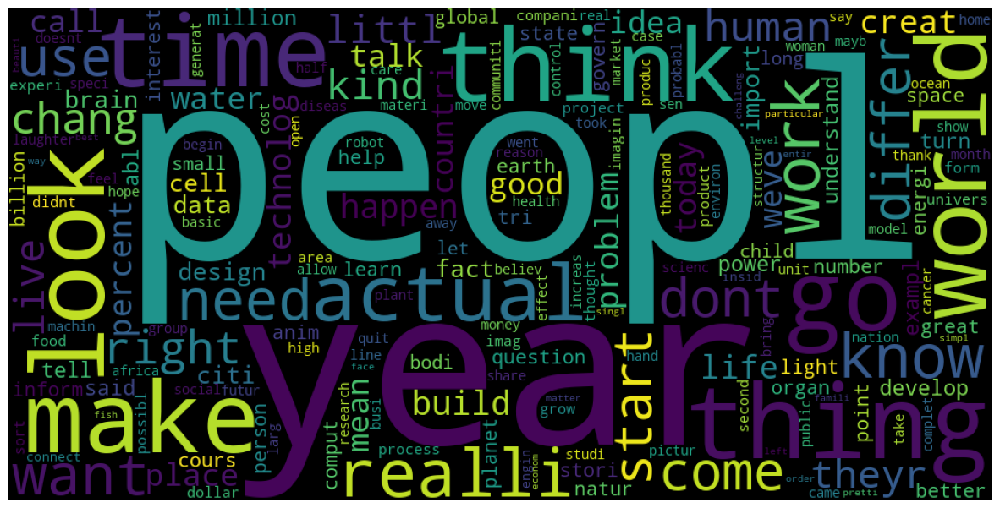

In [30]:
# Create a WordCloud object with specific width and height
# Set collocations to False to avoid including bigrams (pairs of adjacent words)
wordcloud = WordCloud(width = 1000, height = 500, collocations = False)

# Generate the word cloud from the text in 'transcript' column of 'cluster_0'
# The ' '.join(cluster_1['transcript']) part combines all the transcripts into a single string
wordcloud = wordcloud.generate_from_text(' '.join(cluster_0['transcript']))

# Create a new figure with specific size (15x8)
plt.figure(figsize=(15,8))

# Display the generated word cloud as an image
plt.imshow(wordcloud)

# Turn off the axis labels
plt.axis("off")

# Display the figure
plt.show()

We have successfully built the clusters and visualized them as well. Though we cannot interpret or conclude much from the word clouds, in ideal scenarios, word clouds are the best way to visualize text.
Next, let’s perform topic modeling and further interpret the clusters.

## Topic Modeling

Topic modeling is a method to derive topics from the corpus of text. A document may cover any number of topics, like cricket, entertainment, and so on. Using LDA, you can extract all such topics present in the document.

Let’s start building one.

In [31]:
import re
import nltk
from nltk.stem import SnowballStemmer

# Create a Snowball stemmer
st = SnowballStemmer("english")

def process(doc):
    """
    Process a document by tokenizing, filtering non-alphabetic tokens, and stemming words.

    Parameters:
    doc (str): The document to process.

    Returns:
    list: The processed words.
    """
    # Tokenize the document into sentences, then tokenize each sentence into words
    toks = [w for s in nltk.sent_tokenize(doc) for w in nltk.word_tokenize(s)]

    # Initialize an empty list to hold the filtered tokens
    filt_toks = []

    # Filter out tokens that do not contain any alphabetic characters
    for i in toks:
        if re.search('[a-zA-Z]', i):
            filt_toks.append(i)

    # Stem the filtered tokens
    post_process = [st.stem(t) for t in filt_toks]

    # Return the processed words
    return post_process

### Topic Modelling for Cluster 1

In [32]:
# Import the necessary libraries
from gensim import corpora, models
from nltk.corpus import stopwords

# Define the list of stopwords
sw = stopwords.words('english')

# Process the transcripts in 'cluster_1' using the 'process' function defined earlier
# This will tokenize, filter, and stem the words in each transcript
toks = [process(a) for a in cluster_1.transcript]

# Remove stopwords from the tokens
talks = [[x for x in y if x not in sw] for y in toks]

# Create a dictionary from the processed transcripts
# This will map each unique word to an integer ID
dictionary = corpora.Dictionary(talks)

# Convert the processed transcripts into a bag-of-words format
# This will represent each transcript as a list of tuples, where each tuple contains a word's ID and frequency
doc = [dictionary.doc2bow(text) for text in talks]

# Perform topic modeling using the LDA (Latent Dirichlet Allocation) model
# This will identify 5 topics in the transcripts
tm = models.LdaModel(doc, num_topics=5, id2word=dictionary)

# Display the topics identified by the model
tm.show_topics()

[(0,
  '0.010*"like" + 0.009*"thing" + 0.009*"think" + 0.009*"peopl" + 0.009*"know" + 0.007*"want" + 0.007*"time" + 0.007*"go" + 0.007*"realli" + 0.006*"make"'),
 (1,
  '0.015*"like" + 0.012*"peopl" + 0.009*"think" + 0.009*"thing" + 0.007*"want" + 0.007*"go" + 0.007*"know" + 0.006*"said" + 0.006*"time" + 0.006*"right"'),
 (2,
  '0.013*"peopl" + 0.011*"know" + 0.009*"like" + 0.008*"thing" + 0.008*"think" + 0.007*"go" + 0.007*"realli" + 0.007*"dont" + 0.007*"look" + 0.007*"make"'),
 (3,
  '0.009*"like" + 0.008*"know" + 0.008*"time" + 0.008*"think" + 0.007*"want" + 0.006*"go" + 0.006*"peopl" + 0.006*"thing" + 0.006*"said" + 0.006*"make"'),
 (4,
  '0.015*"peopl" + 0.009*"like" + 0.008*"know" + 0.008*"go" + 0.008*"think" + 0.008*"thing" + 0.007*"want" + 0.007*"dont" + 0.006*"time" + 0.006*"world"')]

In [33]:
# Import the necessary libraries
import pyLDAvis.gensim
import warnings

# Enable the notebook mode of pyLDAvis
# This will allow the visualization to be displayed inline in a Jupyter notebook
pyLDAvis.enable_notebook()

# Ignore deprecation warnings
# This will prevent deprecation warnings from being displayed, which can make the output cleaner
warnings.filterwarnings("ignore", category=DeprecationWarning)

# Prepare the LDA model, the bag-of-words corpus, and the dictionary for visualization
# This will convert the LDA model, the bag-of-words corpus, and the dictionary into a format that can be used by pyLDAvis
lda_display = pyLDAvis.gensim.prepare(tm, doc, dictionary)

# Display the visualization
lda_display

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2      0.004868  0.002016       1        1  35.826991
1      0.001662 -0.007753       2        1  27.770847
4      0.003450  0.003423       3        1  20.424217
3     -0.009019  0.000809       4        1   8.235446
0     -0.000962  0.001504       5        1   7.742499, topic_info=      Term          Freq         Total Category  logprob  loglift
272   like  10872.000000  10872.000000  Default  30.0000  30.0000
506   time   6066.000000   6066.000000  Default  29.0000  29.0000
501  think   8261.000000   8261.000000  Default  28.0000  28.0000
258   know   8740.000000   8740.000000  Default  27.0000  27.0000
539   want   6707.000000   6707.000000  Default  26.0000  26.0000
..     ...           ...           ...      ...      ...      ...
271   life    240.277446   3236.198300   Topic5  -5.7694  -0.0419
419   said    313.397446   5274.597194   Topic5  -5.5037  -0.2647
411  right    280.477457   4498.059989   Topic5  -5.6147  -0.2165
558  world    278.132808   4775.038562   Topic5  -5.6231  -0.2846
80    come    266.594208   4340.844559   Topic5  -5.6655  -0.2317

[456 rows x 6 columns], token_table=       Topic      Freq          Term
term                                
1447       1  0.302335           abl
1447       2  0.374005           abl
1447       3  0.182884           abl
1447       4  0.079909           abl
1447       5  0.060137           abl
...      ...       ...           ...
33357      4  0.641455  youtubeusman
23341      1  0.244497         zinta
23341      2  0.244497         zinta
23341      3  0.244497         zinta
23341      4  0.244497         zinta

[1073 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 2, 5, 4, 1])

### Topic Modeling for Cluster 0

In [34]:
# Process the transcripts in 'cluster_0' using the 'process' function defined earlier
# This will tokenize, filter, and stem the words in each transcript
toks = [process(a) for a in cluster_0.transcript]

# Remove stopwords from the tokens
talks = [[x for x in y if x not in sw] for y in toks]

# Create a dictionary from the processed transcripts
# This will map each unique word to an integer ID
dictionary = corpora.Dictionary(talks)

# Convert the processed transcripts into a bag-of-words format
# This will represent each transcript as a list of tuples, where each tuple contains a word's ID and frequency
doc = [dictionary.doc2bow(text) for text in talks]

# Perform topic modeling using the LDA (Latent Dirichlet Allocation) model
# This will identify 5 topics in the transcripts
tm = models.LdaModel(doc, num_topics=5, id2word=dictionary)

# Display the topics identified by the model
tm.show_topics()

[(0,
  '0.007*"like" + 0.007*"make" + 0.006*"peopl" + 0.006*"thing" + 0.006*"time" + 0.005*"look" + 0.005*"actual" + 0.005*"realli" + 0.005*"think" + 0.005*"go"'),
 (1,
  '0.010*"peopl" + 0.008*"like" + 0.007*"year" + 0.006*"think" + 0.006*"know" + 0.006*"world" + 0.005*"go" + 0.005*"make" + 0.004*"realli" + 0.004*"work"'),
 (2,
  '0.009*"like" + 0.007*"go" + 0.007*"world" + 0.006*"thing" + 0.006*"year" + 0.006*"peopl" + 0.006*"think" + 0.005*"want" + 0.005*"know" + 0.005*"time"'),
 (3,
  '0.010*"like" + 0.009*"thing" + 0.007*"peopl" + 0.007*"look" + 0.006*"year" + 0.006*"make" + 0.006*"time" + 0.005*"actual" + 0.005*"go" + 0.005*"realli"'),
 (4,
  '0.008*"like" + 0.008*"peopl" + 0.008*"look" + 0.007*"think" + 0.007*"year" + 0.007*"time" + 0.006*"work" + 0.006*"actual" + 0.006*"make" + 0.005*"realli"')]

In [35]:
# Prepare the LDA model, the bag-of-words corpus, and the dictionary for visualization
# This will convert the LDA model, the bag-of-words corpus, and the dictionary into a format that can be used by pyLDAvis
lda_display = pyLDAvis.gensim.prepare(tm, doc, dictionary)

# Display the visualization
lda_display

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.004946 -0.005748       1        1  32.261713
2     -0.006242 -0.000166       2        1  24.085577
1     -0.004531 -0.001520       3        1  18.492801
3      0.003070  0.000058       4        1  17.710009
0      0.002756  0.007376       5        1   7.449901, topic_info=       Term         Freq        Total Category  logprob  loglift
432   thing  5489.000000  5489.000000  Default  30.0000  30.0000
254    make  4973.000000  4973.000000  Default  29.0000  29.0000
304   peopl  7107.000000  7107.000000  Default  28.0000  28.0000
237    like  8192.000000  8192.000000  Default  27.0000  27.0000
71     come  3199.000000  3199.000000  Default  26.0000  26.0000
...     ...          ...          ...      ...      ...      ...
1827  human   184.646786  2783.549612   Topic5  -5.9289  -0.1161
471    want   199.645473  3970.783082   Topic5  -5.8508  -0.3932
55    chang   183.329962  2903.939588   Topic5  -5.9361  -0.1656
210    kind   178.700412  2671.304656   Topic5  -5.9617  -0.1076
39    build   172.855227  2423.966031   Topic5  -5.9949  -0.0437

[463 rows x 6 columns], token_table=       Topic      Freq     Term
term                           
1106       1  0.347977      abl
1106       2  0.182733      abl
1106       3  0.183336      abl
1106       4  0.213490      abl
1106       5  0.072370      abl
...      ...       ...      ...
21382      1  0.485288  yogurti
12204      1  0.152123    zerog
12204      2  0.304247    zerog
12204      3  0.456370    zerog
12204      4  0.152123    zerog

[1141 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 3, 2, 4, 1])

We finally extracted the topics from both clusters and visualized them. This acts as cluster properties as we analyze structured data that we can use for interpretation, cluster naming, and business strategies.

It seems like the data set is not suitable for a document clustering task. Ideally, we would have more than two clusters, and clustering would segment so that each cluster topics and word cloud have relevant, unique topics in them

## Conclusion

To summarize, the following were covered in this project.
- Understanding business problems
- Data collection from open source
- Understanding data and creating a separate data frame for another use case by considering only the column that consists of raw TED Talks
- Text preprocessing
- Feature engineering techniques like count vectorizer, word-level TF-IDF, word embeddings
- At the model building phase, k-means unsupervised learning approach
- Considered three methods: elbow, silhouette score, and dendrogram to define the number of clusters
- Clusters are visualized through monogram word cloud to get more sense out of it and for cluster interpretation
- Topic extraction from each cluster using LDA techniques to further enhance the cluster interpretation
- Each topic model for clusters is visualized separately by using pyLDAvis
- Insights are drawn from word clouds on clusters and their corresponding topic models
